## **Milestone 2**

### **Cleaning and Chaining**

I couldn't get the methods to import but I have the code for importing it in place and indicated those methods that would have come from project_functions in my code.

In [22]:
from .. import project_functions
df = load_and_process("../../data/raw/winequality-white.csv")
df

ImportError: attempted relative import with no known parent package

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns

def load_and_process(url_or_path_to_csv_file): #Method for loading in and processing the data

# Method Chain 1 (Load data, deal with missing data, and make data readable)
    df1 = (
        pd.read_csv(url_or_path_to_csv_file)
        .dropna()
        .sort_values("alcohol", ascending=False)
        .sort_values("fixed acidity", ascending=False)
        .reset_index(drop=True)
        )

# Method Chain 2 (Create new columns, drop others, and do processing)

    df2 = (df1
        .rename(columns={"free sulfur dioxide": "free SO2"})
        .rename(columns={"total sulfur dioxide": "total SO2"})
        .assign(high_quality = lambda x: x['quality']>4) #removes outliers from quality
        .loc[df1['residual sugar']<20] #removes outliers from variables using limits determined by box plots
        .loc[df1['residual sugar']>2]
        .loc[df1['fixed acidity']<9]
        .loc[df1['volatile acidity']<0.52]
        .loc[df1['citric acid']<0.55]
      )

# Make sure to return the latest dataframe
    return df2

In [94]:
df = load_and_process("../../data/raw/winequality-white.csv")
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free SO2,total SO2,density,pH,sulphates,alcohol,quality,high_quality
89,8.9,0.240,0.33,15.75,0.035,16.0,132.0,0.99600,3.00,0.37,12.1,6,True
90,8.9,0.270,0.34,10.70,0.029,19.5,166.0,0.99669,3.13,0.48,10.6,5,True
94,8.9,0.300,0.35,4.60,0.032,32.0,148.0,0.99458,3.15,0.45,11.5,7,True
100,8.9,0.300,0.35,4.60,0.032,32.0,148.0,0.99458,3.15,0.45,11.5,7,True
102,8.9,0.210,0.34,7.10,0.037,33.0,150.0,0.99620,3.10,0.45,9.7,6,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4891,4.4,0.460,0.10,2.80,0.024,31.0,111.0,0.98816,3.48,0.34,13.1,6,True
4892,4.4,0.320,0.39,4.30,0.030,31.0,127.0,0.98904,3.46,0.36,12.8,8,True
4895,4.2,0.215,0.23,5.10,0.041,64.0,157.0,0.99688,3.42,0.44,8.0,3,False
4896,3.9,0.225,0.40,4.20,0.030,29.0,118.0,0.98900,3.57,0.36,12.8,8,True


<AxesSubplot:>

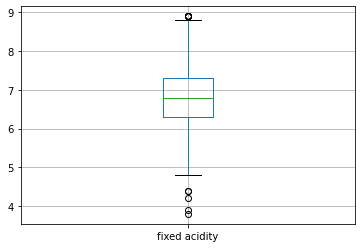

In [95]:
df.boxplot('fixed acidity')

<AxesSubplot:>

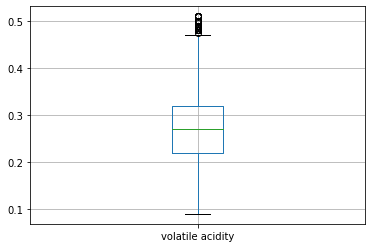

In [96]:
df.boxplot('volatile acidity')

<AxesSubplot:>

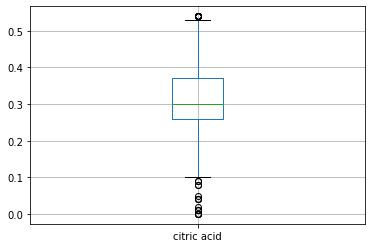

In [97]:
df.boxplot('citric acid')

<AxesSubplot:>

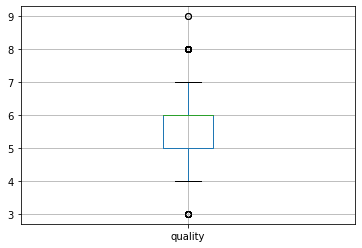

In [98]:
df.boxplot('quality')

In [99]:
def refine_data(dataframe): #Refine the dataset down by removing outiers and 
    dataframe = (dataframe[dataframe['high_quality']==True]
                 .drop(columns = ['high_quality'])
                 .reset_index() # resets the index for the data set after removing rows during data cleaning
                 )
 
    return dataframe

In [100]:
df = refine_data(df)
df

,index,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free SO2,total SO2,density,pH,sulphates,alcohol,quality
0,89,8.9,0.240,0.33,15.75,0.035,16.0,132.0,0.99600,3.00,0.37,12.1,6
1,90,8.9,0.270,0.34,10.70,0.029,19.5,166.0,0.99669,3.13,0.48,10.6,5
2,94,8.9,0.300,0.35,4.60,0.032,32.0,148.0,0.99458,3.15,0.45,11.5,7
3,100,8.9,0.300,0.35,4.60,0.032,32.0,148.0,0.99458,3.15,0.45,11.5,7
4,102,8.9,0.210,0.34,7.10,0.037,33.0,150.0,0.99620,3.10,0.45,9.7,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000,4881,4.8,0.340,0.00,6.50,0.028,33.0,163.0,0.99390,3.36,0.61,9.9,6
3001,4891,4.4,0.460,0.10,2.80,0.024,31.0,111.0,0.98816,3.48,0.34,13.1,6
3002,4892,4.4,0.320,0.39,4.30,0.030,31.0,127.0,0.98904,3.46,0.36,12.8,8
3003,4896,3.9,0.225,0.40,4.20,0.030,29.0,118.0,0.98900,3.57,0.36,12.8,8


### **EDA**

Explorotory data analysis to find corolations in the data set specifically how differant acidities affect the percieved quality of the wine

In [101]:
df.columns

Index(['index', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free SO2', 'total SO2', 'density', 'pH',
       'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [102]:
df.shape

(3005, 13)

In [103]:
import pandas_profiling as pdp
profile = pdp.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

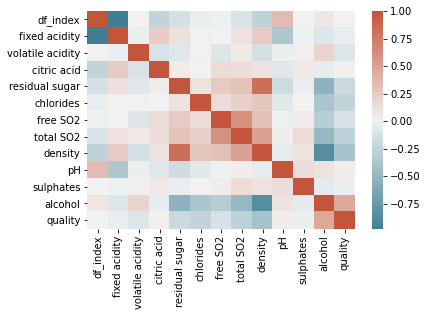

In [104]:
corr = df.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=False, cmap=sns.diverging_palette(220, 20, as_cmap=True))

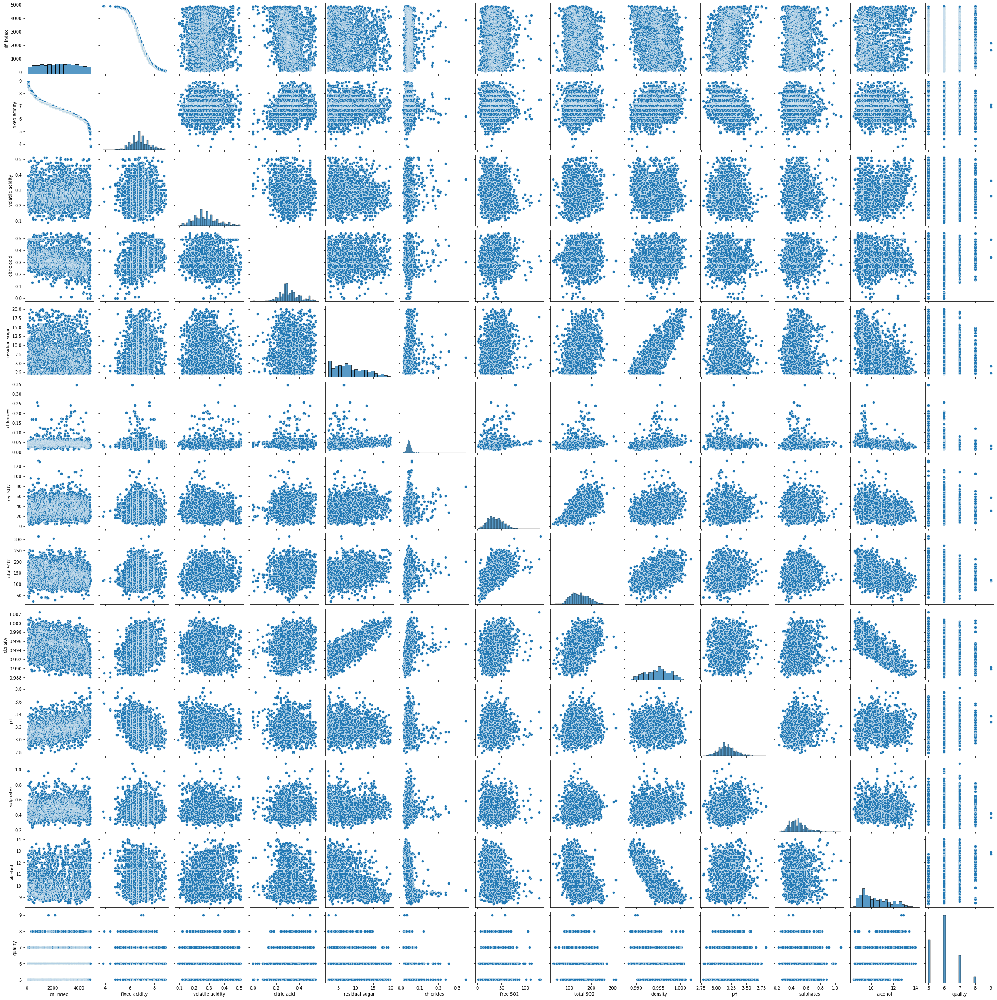

In [105]:
sns.pairplot(df)

<AxesSubplot:xlabel='fixed acidity', ylabel='quality'>

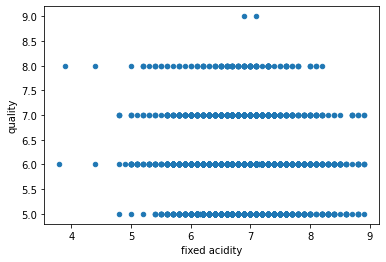

In [106]:
df.plot(kind='scatter', x='fixed acidity', y='quality')

<AxesSubplot:xlabel='volatile acidity', ylabel='quality'>

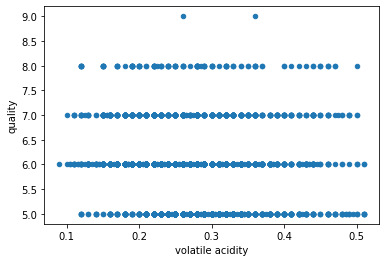

In [107]:
df.plot(kind='scatter', x='volatile acidity', y='quality')

<AxesSubplot:xlabel='citric acid', ylabel='quality'>

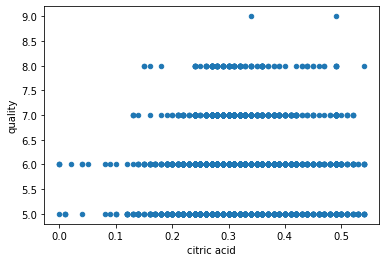

In [108]:
df.plot(kind='scatter', x='citric acid', y='quality')